In [1]:
import netCDF4 as nc
import scipy.io as sio
import os,sys,fnmatch,time
from scipy import interpolate
import numpy as np
import numpy.ma as ma
import math
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.cm as cm
import cmocean as cmo

from salishsea_tools.nc_tools import scDataset
from salishsea_tools import geo_tools

import sys
sys.path.append('/ocean/imachuca/Canyons/mackenzie_canyon/tools/')
import functions_plot

sys.path.append('/ocean/imachuca/Canyons/analysis_mackenzie_canyon/notebooks/general_circulation/')
import general_functions
import quicklook

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

(cmapmc, norm) = functions_plot.Colormap()
from matplotlib.colors import ListedColormap
cmapmc_r = ListedColormap(cmapmc.colors[::-1])
from matplotlib.colors import LinearSegmentedColormap
colour_list = ["#c8274c","#f25546","#F06543","#e96e33",
               "#f0b038","#FFE74C","#69b944","#72b286",
               "#69b0bc","#619ee4","#4b5bbb"][::-1]
cmapIAM = LinearSegmentedColormap.from_list('mycmap', colour_list, N=500, gamma=1)

## Functions for observations

In [2]:
data = sio.loadmat('./MackenzieTransects.mat')

struct_north = data['stn']
struct_south = data['sts']

dtype_north = struct_north.dtype
dtype_south = struct_south.dtype

data_north = {n: struct_north[n][0, 0] for n in dtype_north.names}
data_south = {n: struct_south[n][0, 0] for n in dtype_south.names}

obs_lat_s = data_south['lat_adcp'][0,:]
obs_lon_s = data_south['lon_adcp'][0,:]
obs_dist_s = data_south['dist_adcp'][0,:]
obs_z_s = data_south['z_adcp'][:, 0]
obs_u_s = data_south['u'][:]
obs_v_s = data_south['v'][:]


obs_lat_n = data_north['lat_adcp'][0,:]
obs_lon_n = data_north['lon_adcp'][0,:]
obs_dist_n = data_north['dist_adcp'][0,:]
obs_z_n = data_north['z_adcp'][:, 0]
obs_u_n = data_north['u'][:]
obs_v_n = data_north['v'][:]

In [3]:
def find_nearest(array,value):
    idx = (np.abs(array-value)).argmin()
    return idx

def get_obs_mean(vel_n, vel_s, z, dep1, dep2):
    
    ind1 = find_nearest(z, dep1)
    ind2 = find_nearest(z, dep2)
    
    vel_mean_n = np.mean(vel_n[ind1:ind2, :], axis=0)
    vel_mean_s = np.mean(vel_s[ind1:ind2, :], axis=0)
    
    return vel_mean_n, vel_mean_s, z[ind1], z[ind2]

## Functions for model results

In [4]:
def get_deps(dirname, velocity):
    fname = "1_MCKNZ_1h_20170101_201701*"
    
    if velocity == 'U':
        name_grid = 'grid_U'
        name_depth = 'depthu'
            
    elif velocity == 'V':
        name_grid = 'grid_V'
        name_depth = 'depthv'
        
    files = general_functions.get_files(dirname, fname, name_grid)
    with scDataset(files) as ds:
        depth = ds.variables[name_depth][:]
        
    return depth

In [5]:
def get_vars(dirname, dep1, dep2, time_start, time_end, velocity):
    fname = "1_MCKNZ_1h_20170101_201701*"
    y,x = slice(1,-1,None), slice(1,-1,None)
    
    # --------------------------------------------------------
    
    depth = get_deps(dirname, velocity)
    dep_start = find_nearest(depth, dep1)
    dep_end = find_nearest(depth, dep2)
    
    # --------------------------------------------------------
    
    if velocity == 'U':
        name_grid = 'grid_U'
        name_depth = 'depthu'
        name_vel = 'vozocrtx'
        name_mask = 'umask'
        
    elif velocity == 'V':
        name_grid = 'grid_V'
        name_depth = 'depthv'
        name_vel = 'vomecrty'
        name_mask = 'vmask'
        
    # --------------------------------------------------------
        
    files = general_functions.get_files(dirname, fname, name_grid)    
    with scDataset(files) as ds, nc.Dataset(os.path.join(dirname, '1_mesh_mask.nc'), 'r') as dsM:
        
        if dep_start != dep_end:
            dep_end_new = dep_end + 1
            depth = ds.variables[name_depth][dep_start:dep_end_new]
            vel0 = ds.variables[name_vel][time_start:time_end, dep_start:dep_end_new, y, x]
            mask0 = dsM.variables[name_mask][0, dep_start:dep_end_new, y, x]
            mask = np.tile(mask0, (vel0.shape[0], 1, 1, 1))
            vel = np.ma.array(vel0, mask=1 - mask)
        else: 
            dep_ind = int(dep_start)
            depth = ds.variables[name_depth][dep_ind]
            vel0 = ds.variables[name_vel][time_start:time_end, dep_ind, y, x]
            mask0 = dsM.variables[name_mask][0, dep_ind, y, x]
            mask = np.tile(mask0, (vel0.shape[0], 1, 1))
            vel = np.ma.array(vel0, mask=1 - mask)
        
        nav_lat = ds.variables['nav_lat'][y, x]
        nav_lon = ds.variables['nav_lon'][y, x]
            
    return vel, depth, nav_lat, nav_lon, mask0

In [6]:
def get_vars_mean(dirname, dep1, dep2, time_start, time_end, velocity):
    vel, depth, nav_lat, nav_lon, mask0 = get_vars(dirname, dep1, dep2, time_start, time_end, velocity)
    if vel.shape[1] == 272:
        vel_mean = np.mean(vel, axis=0)
        mask = mask0
    else:
        vel_mean = np.mean(np.mean(vel, axis=0), axis=0)
        mask = mask0[0, ...]
    return vel_mean, vel, depth, nav_lat, nav_lon, mask

## Figures

In [7]:
def get_speeds(U_vel, V_vel, nav_lon, nav_lat, arrow):
    ugrid = U_vel[:]
    vgrid = V_vel[:]
    u_nstg0 = (np.add(ugrid[..., :-1], ugrid[..., 1:]) / 2)[..., 1:, :]
    v_nstg0 = (np.add(vgrid[..., :-1, :], vgrid[..., 1:, :]) / 2)[..., 1:]
    u_nstg = u_nstg0[::arrow,::arrow]
    v_nstg = v_nstg0[::arrow,::arrow]
    x_slice = nav_lon[::arrow,::arrow]
    y_slice = nav_lat[::arrow,::arrow]
    speeds = np.sqrt(u_nstg**2 + v_nstg**2)
    return x_slice, y_slice, u_nstg, v_nstg, speeds

def get_speeds_o(U_vel, V_vel, lon_o, lat_o, arrow):
    ugrid = U_vel[:]
    vgrid = V_vel[:]
    u_nstg0 = (np.add(ugrid[..., :-1], ugrid[..., 1:]) / 2)[:]
    v_nstg0 = (np.add(vgrid[...,:-1], vgrid[...,1:]) / 2)[:]
    u_nstg = u_nstg0[::arrow]
    v_nstg = v_nstg0[::arrow]
    x_slice = lon_o[::arrow]
    y_slice = lat_o[::arrow]
    speeds = np.sqrt(u_nstg**2 + v_nstg**2)
    return x_slice, y_slice, u_nstg, v_nstg, speeds

In [8]:
def plot_comparison(dirname, ttl, time_start, time_end,
                    obs_u_n, obs_u_s, obs_v_n, obs_v_s, obz_z, lon_n, lat_n, lon_s, lat_s):
    
    fig, axes = plt.subplots(4, 3, figsize=(20, 40), sharey=True, sharex=True)
    fig.tight_layout(h_pad=2.5, w_pad=0.01)
    fig.tight_layout(rect=[0, 0, 1, 0.93])
    fig.suptitle('Velocities: model results ("'+ ttl+'" case) compared to observations', fontsize=25)

    cmap = cmo.cm.balance
    cmap.set_bad('silver')
    cmin, cmax = 0.1, 0.4
    ns = np.arange(1, 24)[::2]
    for ax, i, n in zip(axes.flatten(), ns, np.arange(len(ns))):
        dep1, dep2 = obz_z[i], obz_z[i+1]

        mod_u_mean, mod_u, mod_depthu, mod_lat, mod_lon, umask = get_vars_mean(dirname, dep1, dep2, time_start, time_end, 'U')
        mod_v_mean, mod_v, mod_depthv, mod_lat, mod_lon, vmask = get_vars_mean(dirname, dep1, dep2, time_start, time_end, 'V')
        x_slice, y_slice, u_nstg, v_nstg, speeds = get_speeds(mod_u_mean, mod_v_mean, mod_lon, mod_lat, 4)

        obs_u_mean_n, obs_u_mean_s, obs_z_start, obs_z_end = get_obs_mean(obs_u_n, obs_u_s, obz_z, dep1, dep2)
        obs_v_mean_n, obs_v_mean_s, obs_z_start, obs_z_end = get_obs_mean(obs_v_n, obs_v_s, obz_z, dep1, dep2)
        x_slice_n, y_slice_n, u_nstg_n, v_nstg_n, speeds_n = get_speeds_o(obs_u_mean_n, obs_v_mean_n, lon_n, lat_n, 10)
        x_slice_s, y_slice_s, u_nstg_s, v_nstg_s, speeds_s = get_speeds_o(obs_u_mean_s, obs_v_mean_s, lon_s, lat_s, 10)
        
        q = ax.quiver(x_slice, y_slice, u_nstg, v_nstg, speeds, 
                      cmap=cmapIAM, clim=[cmin,cmax], pivot='tail', width=0.005, headwidth=2.5, zorder=2)
        
        ax.quiver(x_slice_n, y_slice_n, u_nstg_n, v_nstg_n, speeds_n, 
                  cmap=cmapIAM, edgecolors='k', clim=[cmin,cmax], pivot='tail', width=0.005, headwidth=2.5, zorder=3)
        ax.quiver(x_slice_s, y_slice_s, u_nstg_s, v_nstg_s, speeds_s, 
                  cmap=cmapIAM, edgecolors='k', clim=[cmin,cmax], pivot='tail', width=0.005, headwidth=2.5, zorder=4)
        
        ax.plot(x_slice_n, y_slice_n, c='k', marker='.', markersize=3.5)
        ax.plot(x_slice_s, y_slice_s, c='k', marker='.', markersize=3.5)
        cmap_land = LinearSegmentedColormap.from_list('mycmap', ['silver', 'white'])
        ax.pcolormesh(mod_lon, mod_lat, umask, cmap=cmap_land, zorder=1)
        
        ax.set_title('observations mean for depths: '+ str(int(dep1)) + ' to ' + str(int(dep2)) +
                     '\nmodel mean for depths: ' + str(mod_depthu) + 
                     '\nand times: '+ str(time_start) + ' to ' + str(time_end) + ' hrs', fontsize=20)
        fig.colorbar(q, ax=ax, pad=0.025, orientation='horizontal')
        w=1/math.cos(math.radians(70.0))
        ax.set_aspect(w)
        ax.set_ylim([mod_lat.min(), mod_lat.max()])
        ax.set_xlim([mod_lon.min(), mod_lon.max()])
    
    return fig

In [9]:
start = 2
time_start, time_end = 24*start, 24*(start+1)

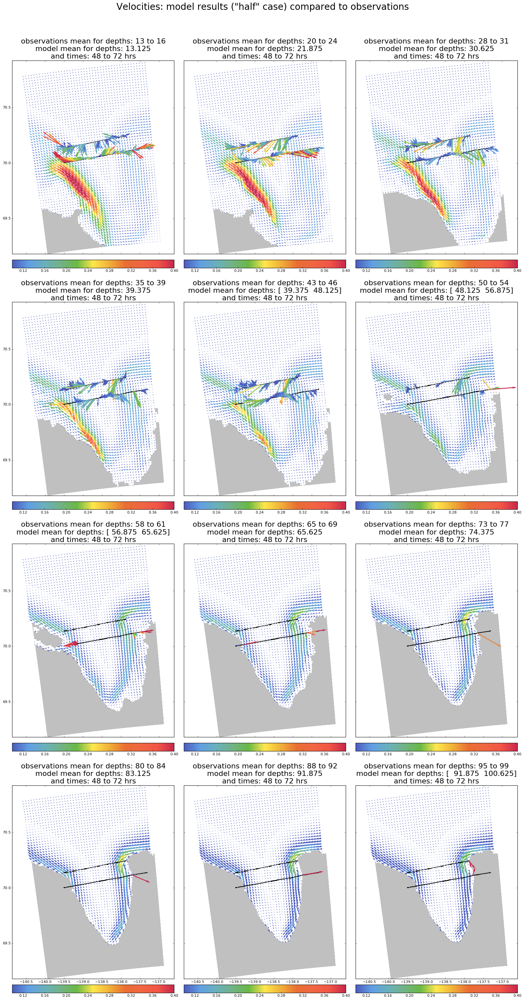

In [11]:
dirname = '/ocean/imachuca/Canyons/results_mackenzie/initial_collection/real_half/'
ttl = 'half'

fig = plot_comparison(dirname, ttl, time_start, time_end,
                      obs_u_n, obs_u_s, obs_v_n, obs_v_s, obs_z_n, obs_lon_n, obs_lat_n, obs_lon_s, obs_lat_s)

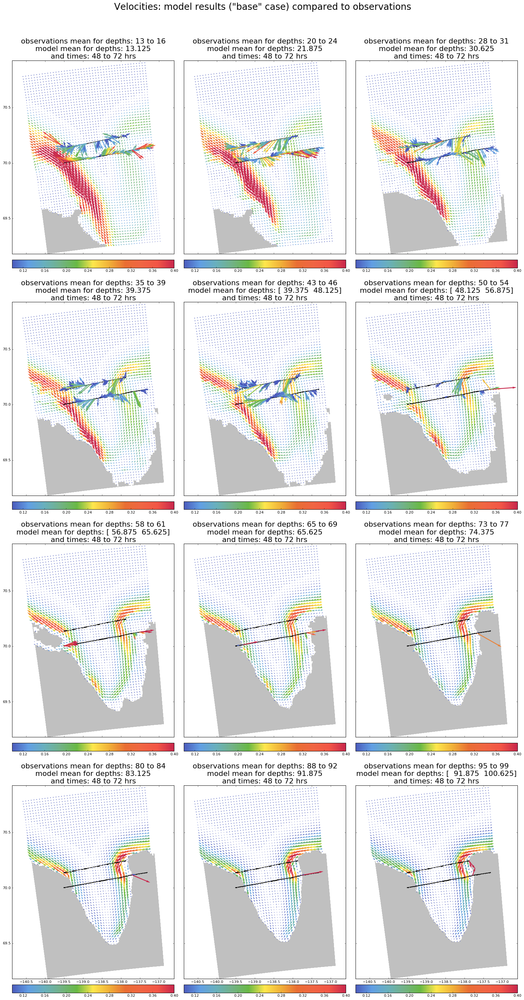

In [12]:
dirname = '/ocean/imachuca/Canyons/results_mackenzie/initial_collection/real_base/'
ttl = 'base'

fig = plot_comparison(dirname, ttl, time_start, time_end,
                      obs_u_n, obs_u_s, obs_v_n, obs_v_s, obs_z_n, obs_lon_n, obs_lat_n, obs_lon_s, obs_lat_s)

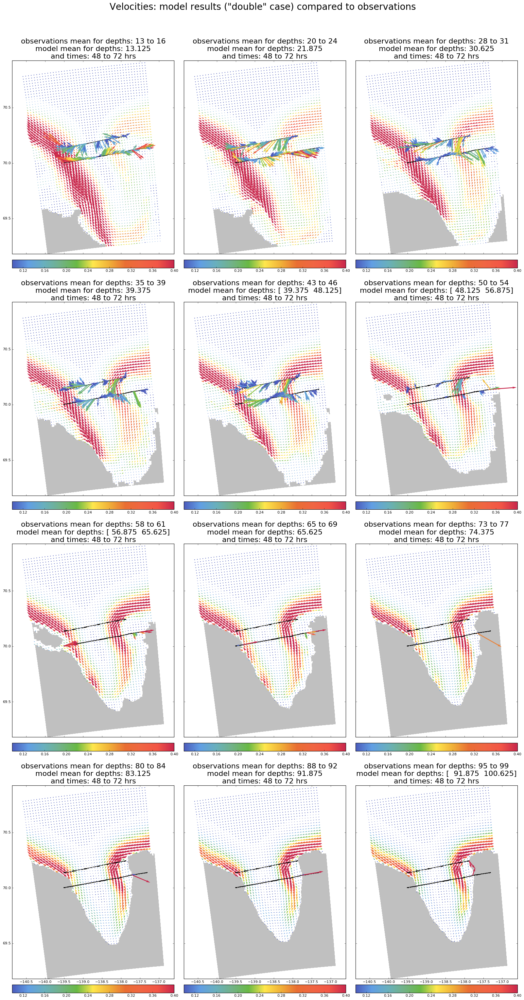

In [13]:
dirname = '/ocean/imachuca/Canyons/results_mackenzie/initial_collection/real_double/'
ttl = 'double'

fig = plot_comparison(dirname, ttl, time_start, time_end,
                      obs_u_n, obs_u_s, obs_v_n, obs_v_s, obs_z_n, obs_lon_n, obs_lat_n, obs_lon_s, obs_lat_s)

fig.savefig('img_MvO_speeds_double_1.png', dpi=100)

In [11]:
def plot_comparison2(dirname, ttl, time_start, time_end,
                    obs_u_n, obs_u_s, obs_v_n, obs_v_s, obz_z, lon_n, lat_n, lon_s, lat_s):
    
    fig, axes = plt.subplots(4, 3, figsize=(20, 40), sharey=True, sharex=True)
    fig.tight_layout(h_pad=2.5, w_pad=0.01)
    fig.tight_layout(rect=[0, 0, 1, 0.93])
    fig.suptitle('Velocities: model results ("'+ ttl+'" case) compared to observations', fontsize=25)

    cmap = cmo.cm.balance
    cmap.set_bad('silver')
    cmin, cmax = 0.1, 0.4
    ns = np.arange(1, 24)[::2]
    for ax, i, n in zip(axes.flatten(), ns, np.arange(len(ns))):
        dep1, dep2 = obz_z[i], obz_z[i+1]

        mod_u_mean, mod_u, mod_depthu, mod_lat, mod_lon, umask = get_vars_mean(dirname, dep1, dep2, time_start, time_end, 'U')
        mod_v_mean, mod_v, mod_depthv, mod_lat, mod_lon, vmask = get_vars_mean(dirname, dep1, dep2, time_start, time_end, 'V')
        x_slice, y_slice, u_nstg, v_nstg, speeds = get_speeds(mod_u_mean, mod_v_mean, mod_lon, mod_lat, 4)

        obs_u_mean_n, obs_u_mean_s, obs_z_start, obs_z_end = get_obs_mean(obs_u_n, obs_u_s, obz_z, dep1, dep2)
        obs_v_mean_n, obs_v_mean_s, obs_z_start, obs_z_end = get_obs_mean(obs_v_n, obs_v_s, obz_z, dep1, dep2)
        x_slice_n, y_slice_n, u_nstg_n, v_nstg_n, speeds_n = get_speeds_o(obs_u_mean_n, obs_v_mean_n, lon_n, lat_n, 10)
        x_slice_s, y_slice_s, u_nstg_s, v_nstg_s, speeds_s = get_speeds_o(obs_u_mean_s, obs_v_mean_s, lon_s, lat_s, 10)
        
        ax.quiver(x_slice, y_slice, u_nstg, v_nstg, color='k', 
                      clim=[cmin,cmax], pivot='tail', width=0.005, headwidth=2.5, zorder=3)
        q = ax.pcolormesh(x_slice, y_slice, speeds, zorder=2, cmap=cm.Blues, vmin=0, vmax=0.9)
        
        ax.quiver(x_slice_n, y_slice_n, u_nstg_n, v_nstg_n, color='mediumpurple', 
                  edgecolors='k', clim=[cmin,cmax], pivot='tail', width=0.005, headwidth=2.5, zorder=5)
        ax.quiver(x_slice_s, y_slice_s, u_nstg_s, v_nstg_s, color='salmon', 
                  edgecolors='k', clim=[cmin,cmax], pivot='tail', width=0.005, headwidth=2.5, zorder=4)
        
        ax.plot(x_slice_n, y_slice_n, c='k', marker='.', markersize=3.5)
        ax.plot(x_slice_s, y_slice_s, c='k', marker='.', markersize=3.5)
        cmap_land = LinearSegmentedColormap.from_list('mycmap', ['silver', 'white'])
        ax.pcolormesh(mod_lon, mod_lat, umask, cmap=cmap_land, zorder=1)
        
        ax.set_title('observations mean for depths: '+ str(int(dep1)) + ' to ' + str(int(dep2)) +
                     '\nmodel mean for depths: ' + str(mod_depthu) + 
                     '\nand times: '+ str(time_start) + ' to ' + str(time_end) + ' hrs', fontsize=20)
        fig.colorbar(q, ax=ax, pad=0.025, orientation='horizontal')
        w=1/math.cos(math.radians(70.0))
        ax.set_aspect(w)
        ax.set_ylim([mod_lat.min(), mod_lat.max()])
        ax.set_xlim([mod_lon.min(), mod_lon.max()])
        
        #ax.set_ylim([69.2, 70.4])
        #ax.set_xlim([-140.6, -137.0])
    
    return fig

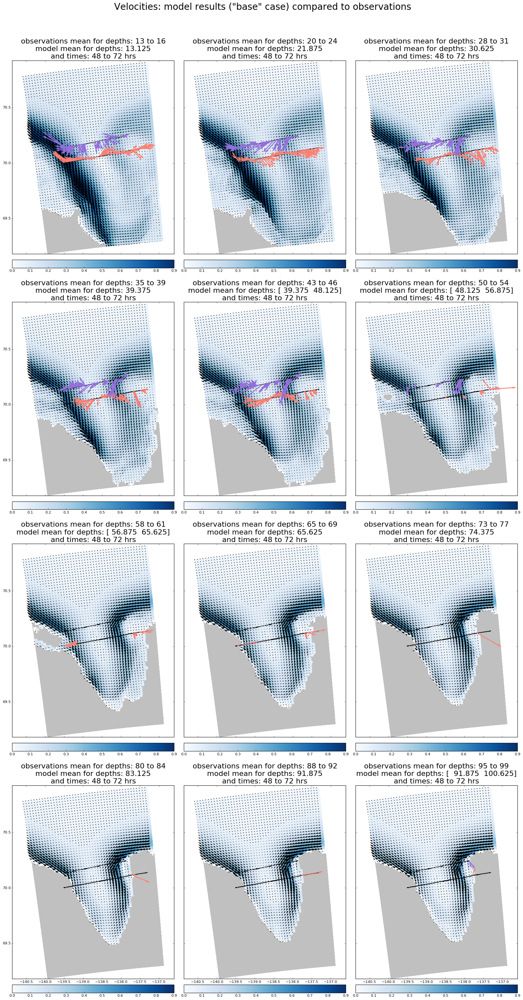

In [14]:
dirname = '/ocean/imachuca/Canyons/results_mackenzie/initial_collection/real_double/'
ttl = 'base'

fig = plot_comparison2(dirname, ttl, time_start, time_end,
                      obs_u_n, obs_u_s, obs_v_n, obs_v_s, obs_z_n, obs_lon_n, obs_lat_n, obs_lon_s, obs_lat_s)

fig.savefig('img_MvO_speeds_double_2.png', dpi=100)